In [342]:
import pandas as pd
# from openpyxl import load_workbook
import lagrangian_case as lc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import rcParams
from cycler import cycler
import matplotlib as mpl
import os
import utils
import met_utils as mu
import matplotlib.dates as mdates

import xarray as xr
from matplotlib import dates as mpldates
from scipy import stats
old_settings = np.seterr(invalid='ignore')  #seterr to known value
import warnings
import datetime as dt
import glob
from CSET_data_classes import CSET_Flight_Piece, CSET_Flight
import matplotlib.gridspec as gridspec

warnings.simplefilter("ignore")
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
case = lc.all_cases[10]
TLC = lc.TrajectoryCase(case['TLC_name'], goes_degree='10deg')
TLC.add_traj_data()
ALC = lc.AircraftCase(case['ALC_name'])
ALC.add_ERA_data()
# ALC.add_precip_data()

In [19]:
# from PIL import Image


# floc = r'/home/disk/eos4/jkcm/Data/CSET/Peter/movies/vid_RF10-RF11.traj_5.5_rh_and_crwc_all_levels_all_levs'
# files = os.listdir(floc)
# for f in files:
#     oldf = os.path.join(floc, f)
#     newf = os.path.join(floc, 'resize', f)

#     size = 1168, 1146

#     try:
#         im = Image.open(oldf)
#         out = im.resize(size, Image.ANTIALIAS)
#         out.save(newf, "PNG")
#     except IOError:
#         print("cannot create thumbnail for '%s'" % oldf)
#     # cv2.imshow("Resized image", resized)
#     # cv2.waitKey(0)
#     # cv2.destroyAllWindows()

cannot create thumbnail for '/home/disk/eos4/jkcm/Data/CSET/Peter/movies/vid_RF10-RF11.traj_5.5_rh_and_crwc_all_levels_all_levs/vid_RF10-RF11.traj_5.5_rh_and_crwc_all_levels_all_levs.mp4'
cannot create thumbnail for '/home/disk/eos4/jkcm/Data/CSET/Peter/movies/vid_RF10-RF11.traj_5.5_rh_and_crwc_all_levels_all_levs/resize'


In [182]:
lats = TLC.traj_data['5.5'].lat
lons = TLC.traj_data['5.5'].lon%360
times = TLC.traj_data['5.5'].time
all_ERA_files = sorted(glob.glob(r'/home/disk/eos4/jkcm/Data/CSET/ERA5/ERA5.pres*.nc'))
ERA_data = xr.open_mfdataset(all_ERA_files)
goes_data = xr.open_mfdataset(utils.get_GOES_files_for_dates(date_array = times.values), concat_dim='time_offset')
goes_data = goes_data.rename(dict(time_offset='time'))
goes_data['longitude'] = goes_data['longitude']%360
lats_6 = TLC.traj_data['6.0'].lat
lons_6 = TLC.traj_data['6.0'].lon%360
times_6 = TLC.traj_data['6.0'].time

36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72


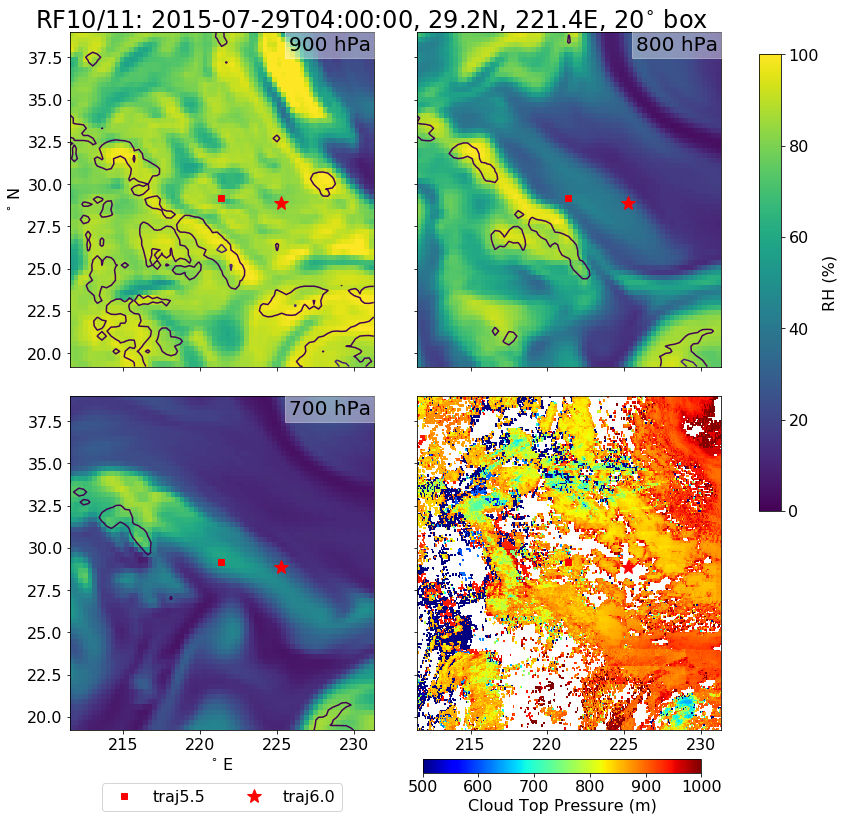

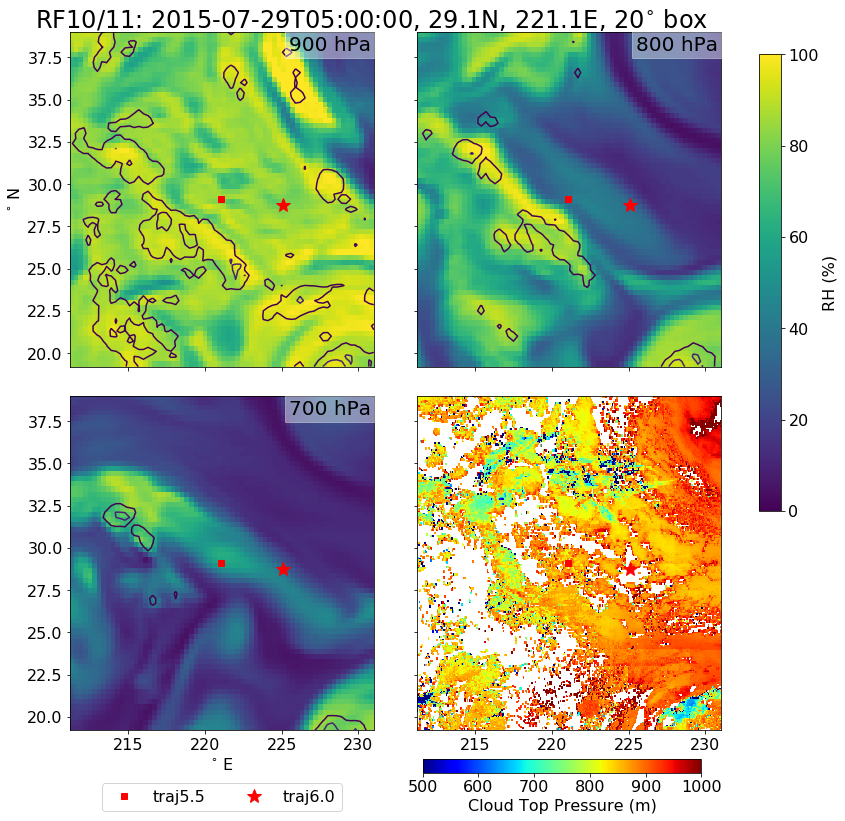

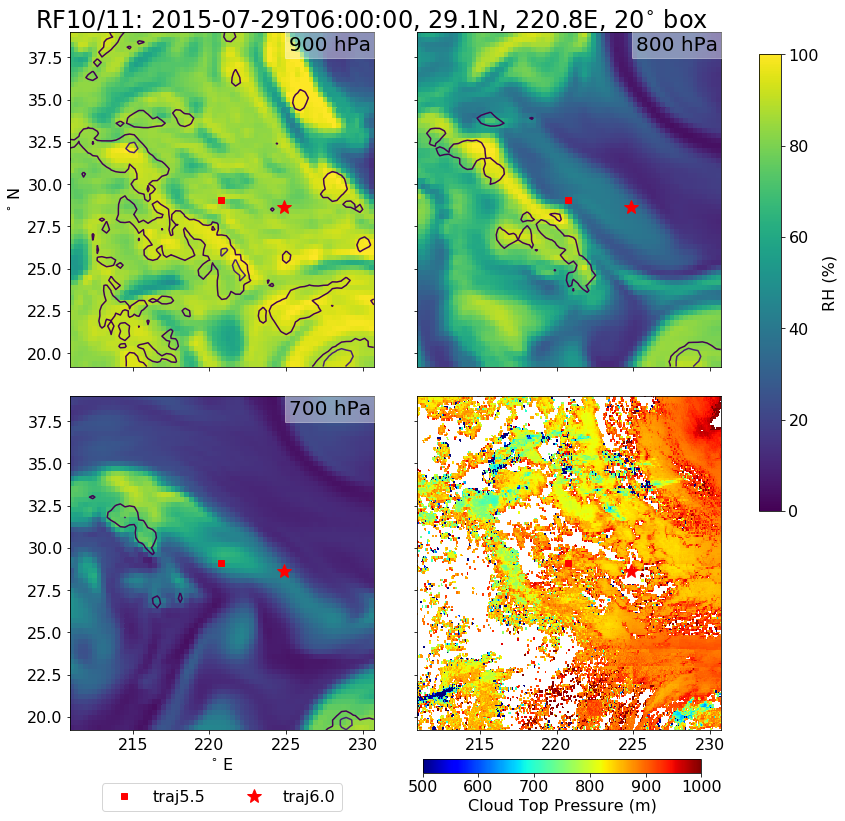

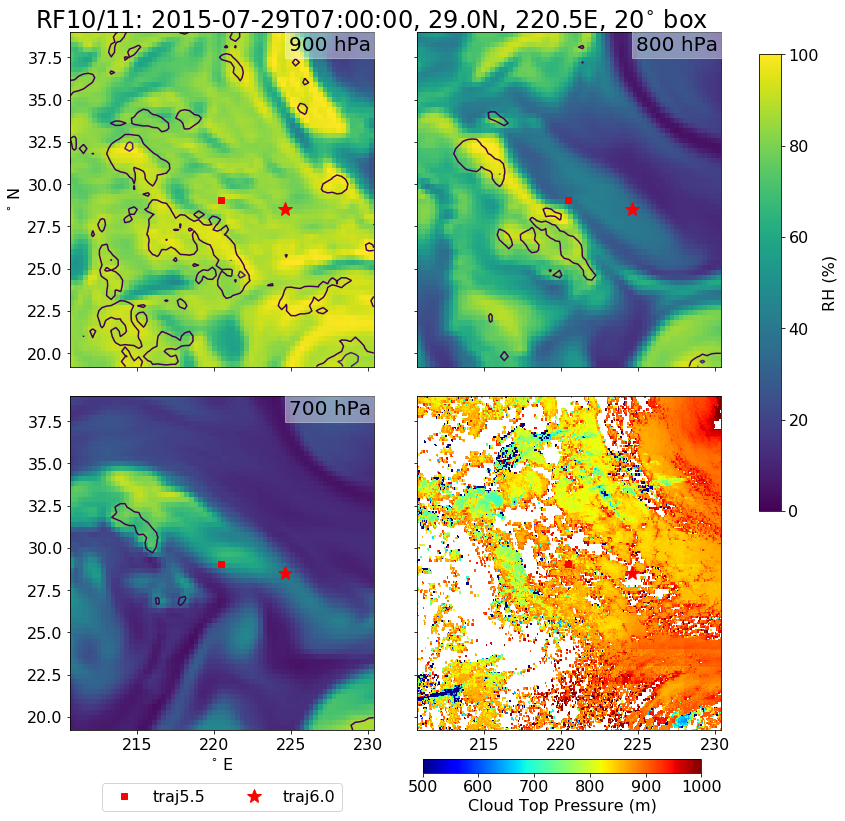

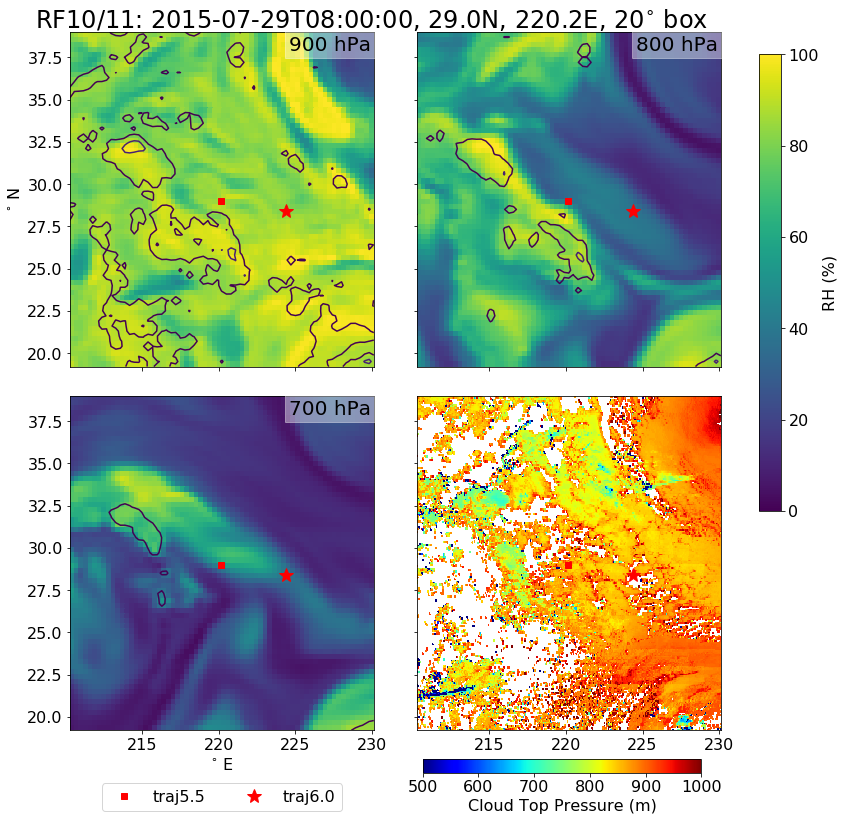

...

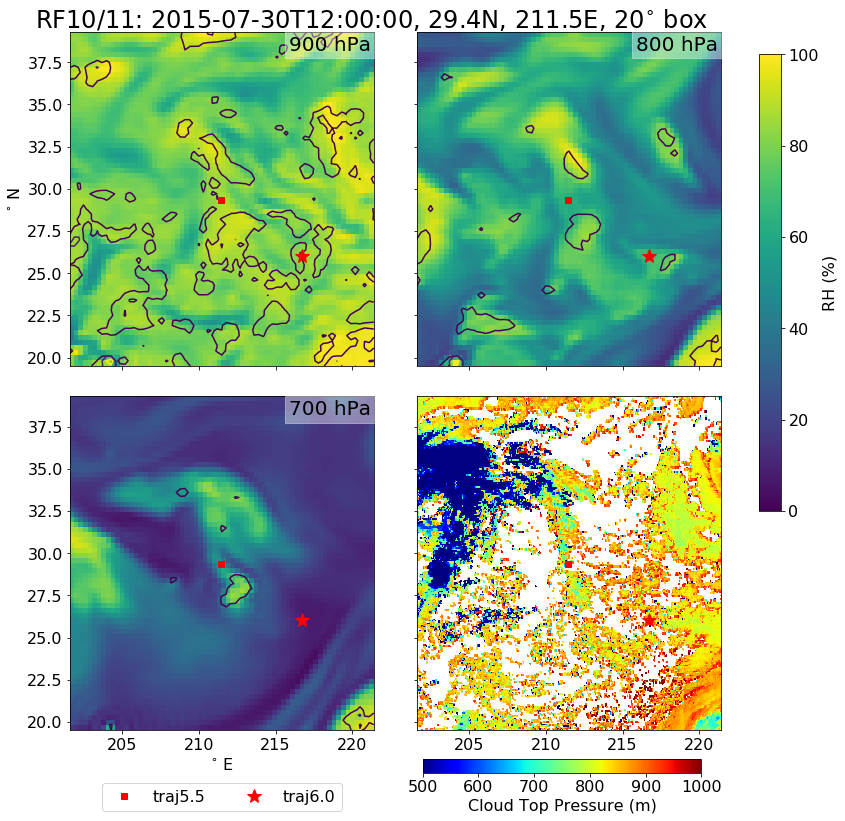

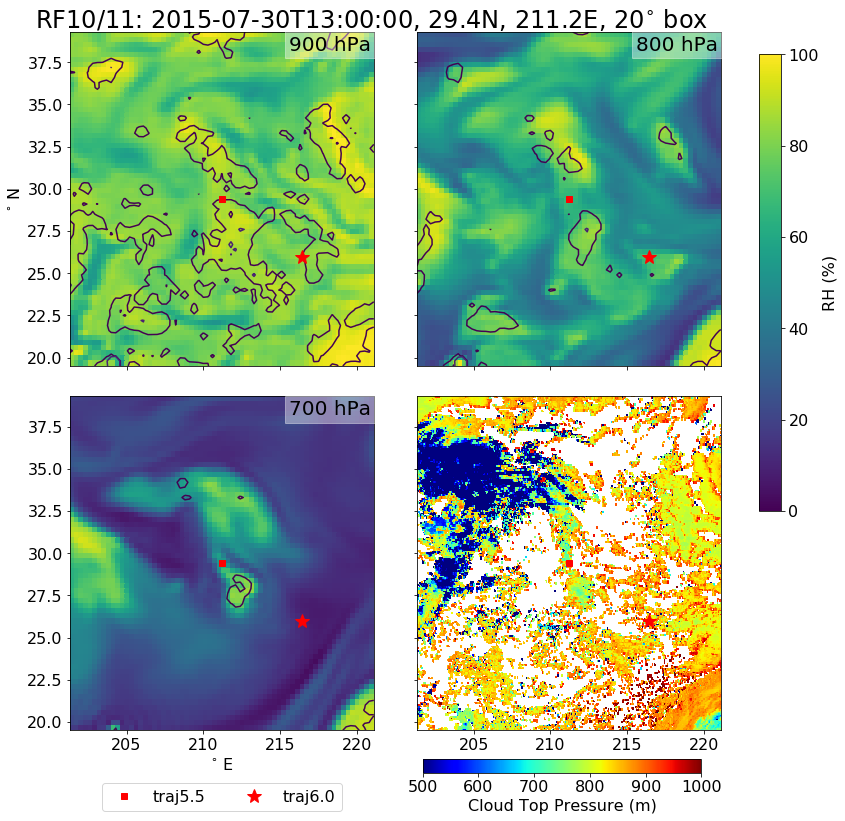

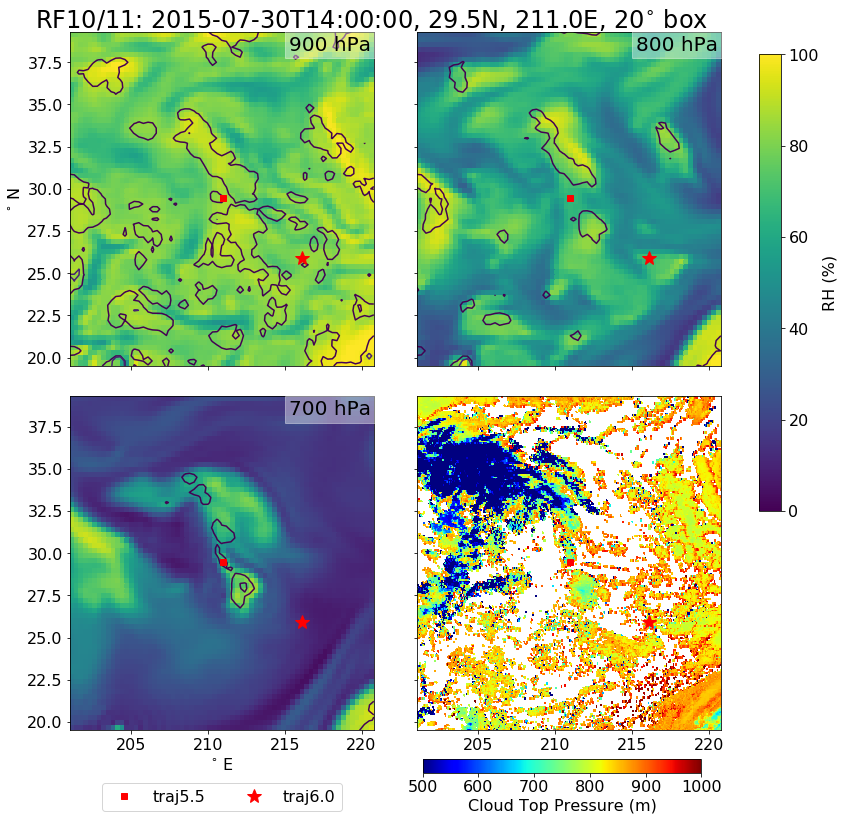

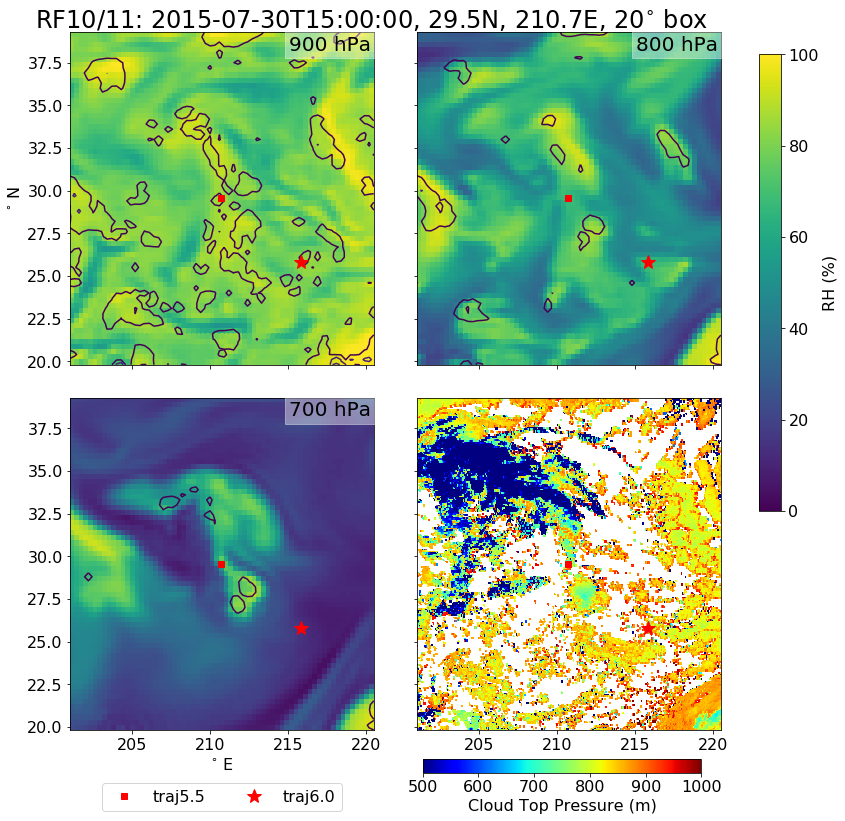

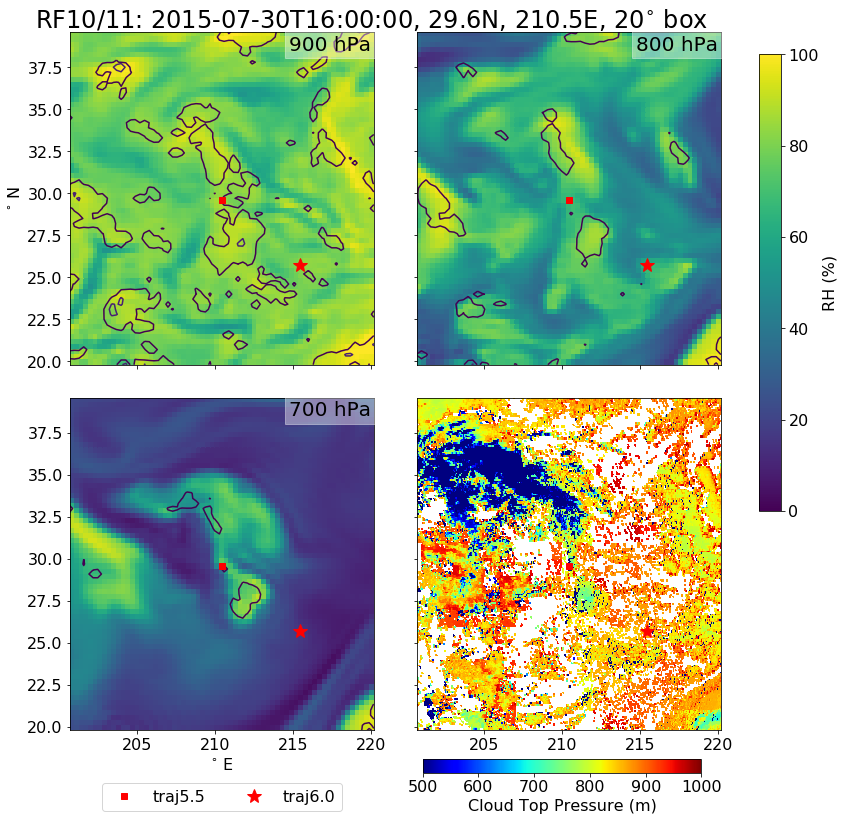

In [6]:
"""Could you show the spatial structure by making a series of pngs that show the x-y slices of the RH field at 1 km, 2km and 3km 
(or whatever pressure model/levels are roughly at those heights)?  If you want to get fancy, you could plot contours of crwc 
with values of 1e-1, 1e-2 and 1e-3 g/kg at those same heights.  In the aircraft data, the layer from about 2-2.5km is relatively dry during RF11.
If it's easier, you could also do this with ERA on a larger lat-lon grid and just throw and x at the location of the two trajectories 
(5.5 and 6.0) at each time.

900mb (~1050m)
800mb (~2050m)
700mb (~3150m)"""

box_degrees=20
name = 'RF10-RF11.traj_5.5_rh_and_crwc_all_levels'
# for lev in [900, 800, 700]:
# if True:
#     lev = 900

savedir = f'/home/disk/eos4/jkcm/Data/CSET/Peter/movies/vid_{name}_all_levs'
if not os.path.exists(savedir):
    os.makedirs(savedir)


for i, (lat,lon,time) in enumerate(zip(lats, lons,times)):
#     if i < 36:
#         continue
    print(i)
# if True:
#     minlat, maxlat, minlon, maxlon = lat-box_degrees/2, lat+box_degrees/2, lon-box_degrees/2, lon+box_degrees/2
#     minlat, maxlat, minlon, maxlon = minlat.values.item(), maxlat.values.item(), minlon.values.item(), maxlon.values.item()
#     lat, lon, time, i = lats[0], lons[0], times[0], 0
    goes_s = goes_data['cloud_top_pressure'].sel(time=time)
    goes_i = goes_s
#     goes_i = goes_s.sel(longitude=slice(lon - box_degrees/2, lon + box_degrees/2),
#                              latitude=slice(lat + box_degrees/2, lat - box_degrees/2))

    lat_6, lon_6, time_6 = lats_6[i], lons_6[i], times_6[i]
    fig, axg = plt.subplots(nrows=2, ncols=2, figsize=(10,10), sharex=True, sharey=True)
    axl = axg.flatten()
    
    for lev, ax in zip([900, 800, 700], axl[:3]):
        crwc = ERA_data['crwc'].sel(longitude=slice(lon - box_degrees/2, lon + box_degrees/2),
                             latitude=slice(lat + box_degrees/2, lat - box_degrees/2),
                             level=lev)
        crwc = crwc.sel(method='nearest', time=time, tolerance=np.timedelta64(1, 'h'))
        rh = ERA_data['r'].sel(longitude=slice(lon - box_degrees/2, lon + box_degrees/2),
                             latitude=slice(lat + box_degrees/2, lat - box_degrees/2),
                             level=lev)
        rh = rh.sel(method='nearest', time=time, tolerance=np.timedelta64(1, 'h'))

        rh_p = ax.pcolormesh(rh.longitude, rh.latitude, rh, vmin=0, vmax=100)
        ax.plot(lon, lat, 'rs', label='traj5.5')
        ax.plot(lon_6, lat_6, 'r*', ms=15, label='traj6.0')
        ax.contour(crwc.longitude, crwc.latitude, crwc*1000, levels = [1e-3, 1e-2, 1e-1])

        an = ax.annotate(f'{lev} hPa', 
                    xy=(0.99, 0.99), xycoords='axes fraction', fontsize=20, color='k',
                        horizontalalignment='right', verticalalignment='top');
        an.set_bbox(dict(alpha=0.4, color='w', edgecolor='k'))
        

    xlim = axl[1].get_xlim()
    ylim = axl[1].get_ylim()
    c_p = axl[3].pcolor(goes_i.longitude.values, goes_i.latitude.values, goes_i, cmap='jet', vmin=500, vmax=1000)
#     c_p = axl[3].pcolormesh(rh.longitude, rh.latitude, rh, vmin=0, vmax=100)
    axl[3].plot(lon, lat, 'rs', label='traj. 5.5')
    axl[3].plot(lon_6, lat_6, 'r*', ms=15, label='traj. 6.0')
    axl[3].set_xlim(xlim)
    axl[3].set_ylim(ylim)
    cb2 = plt.colorbar(c_p, ax=axl, anchor=(1.15, -1.8), shrink=0.5, orientation='horizontal')
    cb2.set_label('Cloud Top Pressure (m)')
    
    
    fig.suptitle(f'RF10/11: {str(time.values)[:19]}, {lat.values:02.1f}N, {lon.values:02.1f}E, {box_degrees}'+r'$^{\circ}$ box', y=1.02)
    axl[0].set_ylabel('$^{\circ}$ N')
    axl[2].set_xlabel('$^{\circ}$ E');
    cb = plt.colorbar(rh_p, ax=axl, anchor=(3, 0.3), shrink=1.2)
    cb.set_label('RH (%)')
    axl[2].legend(loc='center', bbox_to_anchor=(0.5, -0.2), ncol=2)
    
    fig.tight_layout()
    fig.savefig(os.path.join(savedir, f'vid_{name}_all_levs_{i:02d}.png'), bbox_inches='tight');

In [ ]:
# box_degrees=5
# name = 'RF10-RF11.traj_5.5'
# # var = 'r'
# # var_label = 'RH (%)'
# # xmax = 100
# scale = 1

# var = 'crwc'
# var_label = 'Rain WC (g/kg)'
# xmax = 0.01
# scale = 1000

# for i, (lat,lon,time) in enumerate(zip(lats, lons,times)):
# # if True:
# #     lat, lon, time = lats[0], lons[0], times[0]
# #     i = 0
#     x = ERA_data[var].sel(longitude=slice(lon - box_degrees/2, lon + box_degrees/2),
#                                       latitude=slice(lat + box_degrees/2, lat - box_degrees/2))
#     z = x.sel(method='nearest', time=time, tolerance=np.timedelta64(1, 'h'))

#     g1 = ERA_data['z'].sel(longitude=slice(lon - box_degrees/2, lon + box_degrees/2),
#                                       latitude=slice(lat + box_degrees/2, lat - box_degrees/2))
#     g2 = g1.sel(method='nearest', time=time, tolerance=np.timedelta64(1, 'h'))/9.81
#     z_flat = z.values.reshape(z.shape[0], -1) * scale
#     g2_flat = g2.values.reshape(g2.shape[0], -1)
    
#     fig, ax = plt.subplots()
#     ax.plot(z_flat, g2_flat);
#     ax.set_ylim(0, 5000)
#     ax.set_xlim(0, xmax)
#     ax.set_ylabel('height (m)')
#     ax.set_xlabel(var_label);
#     ax.annotate(f'{name}_{var}\n{str(time.values)[:19]}\n{lat.values:02.1f}N, {lon.values:02.1f}E, {box_degrees}'+r'$^{\circ}$ box', xy=(0.6, 0.82), xycoords='axes fraction', fontsize=10);
#     fig.savefig(f'/home/disk/eos4/jkcm/Data/CSET/Peter/movies/vid_{name}_{var}_{i:02d}.png');


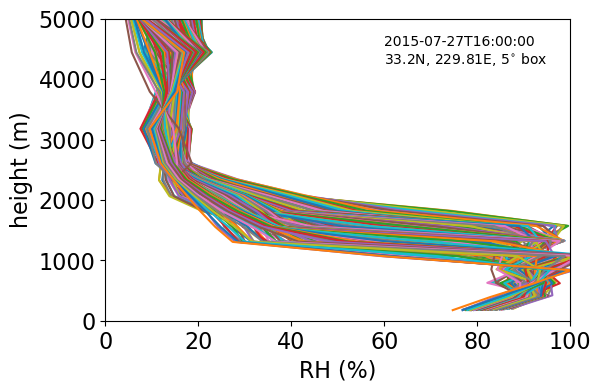

In [114]:
fig, ax = plt.subplots()
ax.plot(z_flat, g2_flat)
ax.set_ylim(0, 5000)
ax.set_xlim(0, 100)
ax.set_ylabel('height (m)')
ax.set_xlabel('RH (%)');
ax.annotate(f'{str(time.values)[:19]}\n{lat.values}N, {lon.values}E, {box_degrees}'+r'$^{\circ}$ box', xy=(0.6, 0.85), xycoords='axes fraction', fontsize=10);
fig.savefig(f'/home/disk/eos4/jkcm/Data/CSET/Peter/movies/vid_{name}_{va}_{i}.png')

In [20]:
# NEXT PLOT: AMSR WVP along traj (4-6 points), with MERRA WVP underlaid snapshots of MERRA moisture where we have AMSR WVP
#The times of the overpasses is in the 'day' variable which is in calendar days, 
#      e.g. datenum(2015,07,27) - datenum(2014,12,31) = 208.0.
amsr_file = r'/home/disk/eos7/bloss/Runs/CSET/Plots/AMSR2_CWV_CSET.nc'
amsr_data = xr.open_dataset(amsr_file)
amsr_data = amsr_data.rename_dims(Latitude='latitude', Longitude='longitude', Time='time')
amsr_data = amsr_data.set_coords(names=['latitude', 'longitude'])
amsr_data['time'] = (('time'), amsr_data.day.mean(dim=['latitude', 'longitude']))
amsr_data.day.attrs['units'] = 'days since 2014-12-31'
amsr_data.time.attrs['units'] = 'days since 2014-12-31'
amsr_data = xr.decode_cf(amsr_data)
amsr_data = amsr_data.set_coords(names=['time'])
ERA_cwv = xr.open_dataset(r'/home/disk/eos4/jkcm/Data/CSET/ERA5/ERA.cwv.nc').tcwv

In [404]:
amsr_halfslice=2
amsr_slices_to_keep = []
amsr_big_halfslice = 10
amsr_bigslice = []
amsr_times = []
latstokeep, lonstokeep, timestokeep = [], [], []

era_slices_to_keep = []
era_times = []

for i, (lat,lon,time) in enumerate(zip(lats_6, lons_6,times_6)):
# if True:
#     lat, lon, time, i = lats[0], lons[0], times[0], 0
    x = amsr_data.sel(latitude=slice(lat-amsr_halfslice, lat+amsr_halfslice), 
                      longitude = slice(lon-amsr_halfslice, lon+amsr_halfslice))
    y = x.sel(time=slice(time-np.timedelta64(5, 'h'), time+np.timedelta64(5, 'h')))
    
    xb = amsr_data.sel(latitude=slice(lat-amsr_big_halfslice, lat+amsr_big_halfslice), 
                      longitude = slice(lon-amsr_big_halfslice, lon+amsr_big_halfslice))
    yb = xb.sel(time=slice(time-np.timedelta64(5, 'h'), time+np.timedelta64(5, 'h')))

    ex = ERA_cwv.sel(latitude=slice(lat+amsr_halfslice, lat-amsr_halfslice), 
                      longitude = slice(lon-amsr_halfslice, lon+amsr_halfslice))
    ey = ex.sel(time=time)
    era_slices_to_keep.append(ey.values.flatten())
    
    if not y.day.shape[0] == 1:
        continue
        
    mean_lag = np.nanmean((y.day - time).values/np.timedelta64(1, 'h'))
    if not np.abs(mean_lag) < 0.5:
        continue
    amsr_times.append(y.day.values.flatten()[~np.isnat(y.day.values.flatten())].astype('int64').mean().astype('datetime64[ns]'))
    latstokeep.append(lat)
    lonstokeep.append(lon)
    timestokeep.append(time)
    amsr_slices_to_keep.append(y)
    amsr_bigslice.append(yb)
era_d = np.array(era_slices_to_keep)
top = np.nanpercentile(era_d, 75, axis=1)
bot = np.nanpercentile(era_d, 25, axis=1)
mean = np.nanmean(era_d, axis=1)

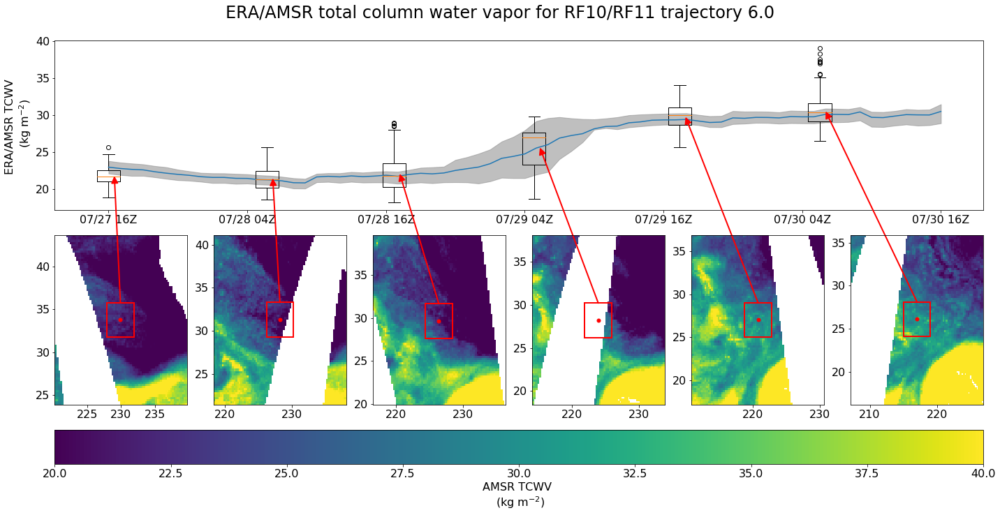

In [406]:
fig = plt.figure(figsize=(20, 10))
gs = gridspec.GridSpec(3, len(amsr_slices_to_keep), height_ratios=(5, 5, 1))
ax = fig.add_subplot(gs[0,:])

data_to_plot = [(i.CWV.values[~np.isnan(i.CWV.values)]).flatten() for i in amsr_slices_to_keep]
ax.boxplot(data_to_plot, 
           positions=(amsr_times-amsr_times[0])/np.timedelta64(1, 'h'), widths=2)#np.array(amsr_times).view('i8'))
#            positions = amsr_times, widths=100)

ax.plot((times-times[0])/np.timedelta64(1, 'h'), mean)
ax.fill_between((times-times[0])/np.timedelta64(1, 'h'), top, bot, color='grey', alpha=0.5)

ax.set_xticks([i*12 for i in range(7)])
ax.set_xticklabels([pd.to_datetime(times[0].values + np.timedelta64(i*12, 'h')).strftime('%m/%d %HZ') for i in range(7)])
ax.set_ylabel('ERA/AMSR TCWV \n (kg m$^{-2}$)')

pd.to_datetime(times[0].values).strftime('%m/%d %HZ')

plt.suptitle('ERA/AMSR total column water vapor for RF10/RF11 trajectory 6.0', y=1.02)

for i, s in enumerate(amsr_bigslice):
#     mtime = np.array(s.day.values, dtype='datetime64[s]').view('i8').mean().astype('datetime64[s]')
    

    axi = fig.add_subplot(gs[1, i])
    pc = axi.pcolormesh(s.longitude, s.latitude, s.CWV[0,:,:], vmin=20, vmax=40)
    axi.plot(lonstokeep[i], latstokeep[i], 'r.', ms=10)
    rect = patches.Rectangle((lonstokeep[i]-amsr_halfslice,latstokeep[i]-amsr_halfslice),2*amsr_halfslice,2*amsr_halfslice,linewidth=2,edgecolor='r',facecolor='none')
    axi.add_patch(rect)
    xyA = (lonstokeep[i].values, latstokeep[i].values+amsr_halfslice)

    xyB = ((amsr_times[i]-amsr_times[0])/np.timedelta64(1, 'h')+0.5, np.nanmean(amsr_slices_to_keep[i].CWV))
    conn = patches.ConnectionPatch(xyA, xyB, "data", "data", axesA=axi, axesB=ax,
                      arrowstyle="-|>",
                      mutation_scale=20, fc="r", color='r', lw=2)
    axi.add_artist(conn)
    
    
cax = fig.add_subplot(gs[2,:])
cb = plt.colorbar(pc, cax=cax, orientation='horizontal', anchor=(0.5, 0), fraction=0.5, pad=0.5)
cb.set_label('AMSR TCWV \n (kg m$^{-2}$)')
fig.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=0.95, wspace=0.2, hspace=0.2)
fig.savefig(r'/home/disk/p/jkcm/dump/AMSR_ERA_TCWV_RF10t6.0.png', bbox_inches='tight')